<a href="https://colab.research.google.com/github/AlvinShen99/MADP/blob/master/sdm_Multi_Hash.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import cv2
import numpy as np
import os
import torch
from torch import nn
import time
from google.colab.patches import cv2_imshow

In [3]:
'''
Multiresolution Hash Encoding from Nvidia Instant-NGP
Please read the Instant-NGP paper Section 3 to understand the code
https://nvlabs.github.io/instant-ngp/assets/mueller2022instant.pdf
'''

''' 
All parameters use the same name as in the paper
'''
class MultiHash(nn.Module):
    
    input_dim: int # dimension of input, currently only support 1 to 7
    output_dim: int # dimension of output, 3 for RGB, 1 for Grayscale
    T: int # size of hash table, which should be 2^T (14 to 24)
    L: int # number of levels (8,12,16)
    F: int # number of features (2,4,8)
    N_min: int # min level resolution (16)
    N_max: int # max level resolution (512 to 524288)
    b: float # step size between each level [1.26,2]

    _hash_tables: nn.Parameter # L hash tables with shape [2^T,F]
    _resolutions: nn.Parameter # resolutions of all levels with shape [1,1,L,1]
    _prime_numbers: nn.Parameter # list of preset big hashing prime numbers
    _voxel_border_adds: nn.Parameter # helper tensor of shape [1,input_dim,1,2^input_dim]
    MLP: nn.ModuleList # default MLP

    '''
    N_max should be half of the picture width for gigapixel image reconstruction
    '''
    def __init__(self, input_dim:int, output_dim:int, T:int=14, L:int=16, F:int=2, N_min:int=16, N_max:int=512):
        super().__init__()
        assert input_dim<=7, "Current hash encoding only supports up to 7 dimensions."
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.T = T
        self.L = L
        self.F = F
        self.N_min = N_min
        self.N_max = N_max

        '''calculate step size for geometric series (equation in paper)'''
        self.b = np.exp((np.log(self.N_max)-np.log(self.N_min))/(self.L-1))
        '''
        integer list of each level resolution: N1, N2, ... , N_max
        shape [1,1,L,1]
        '''
        self._resolutions = nn.Parameter(
            torch.from_numpy(
                np.array([
                    np.floor(self.N_min * (self.b**i)) for i in range(self.L)
                ], dtype=np.int64)).reshape(1,1,-1,1),False)

        '''
        init hash tables fpr all levels
        each hash table shape [2^T,F]
        '''
        self._hash_tables = nn.ModuleList([
            nn.Embedding(2**self.T,self.F) for _ in range(self.L)
        ])
        for i in range(self.L):
            nn.init.uniform_(self._hash_tables[i].weight,-1e-4,1e-4) # init uniform random weight

        '''from Nvidia's Tiny Cuda NN implementation'''
        self._prime_numbers = nn.Parameter(
            torch.tensor([1, 2654435761, 805459861, 3674653429, 2097192037, 1434869437, 2165219737]), requires_grad=False)

        '''
        a helper tensor which generates the voxel coordinates with shape [1,input_dim,1,2^input_dim]
        2D example: [[[[0, 1, 0, 1]],
                      [[0, 0, 1, 1]]]]
        3D example: [[[[0, 1, 0, 1, 0, 1, 0, 1]],  
                      [[0, 0, 1, 1, 0, 0, 1, 1]],  
                      [[0, 0, 0, 0, 1, 1, 1, 1]]]]
        For n-D, the i-th input add the i-th "row" here and there are 2^n possible permutations
        '''
        border_adds = np.empty((self.input_dim, 2**self.input_dim), dtype=np.int64)
        for i in range(self.input_dim):
            pattern = np.array(
                ([0] * (2**i) + [1] * (2**i)) * (2**(self.input_dim-i-1)),
                dtype=np.int64)
            border_adds[i, :] = pattern
        self._voxel_border_adds = nn.Parameter(
            torch.from_numpy(border_adds).unsqueeze(0).unsqueeze(2), False) # helper tensor of shape [1,input_dim,1,2^input_dim]

        # default MLP
        self.MLP = nn.ModuleList(
            [nn.Linear(self.L*self.F, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, self.output_dim)]
        )

    def forward(self, x:torch.Tensor):
        '''
        forward pass, takes a set of input vectors and encodes them
        
        Args:
            x: A tensor of the shape [batch_size, input_dim] of all input vectors.

        Returns:
            A tensor of the shape [batch_size, L*F]
            containing the encoded input vectors.
        '''

        # 1. Scale each input coordinate by each level's resolution
        '''
        elementwise multiplication of [batch_size,input_dim,1,1] and [1,1,L,1]
        '''
        scaled_coords = torch.mul(x.unsqueeze(-1).unsqueeze(-1), self._resolutions) # shape [batch_size,input_dim,L,1]
        # compute the floor of all coordinates
        if scaled_coords.dtype in [torch.float32, torch.float64]:
            grid_coords = torch.floor(scaled_coords).type(torch.int64) # shape [batch_size,input_dim,L,1]
        else:
            grid_coords = scaled_coords # shape [batch_size,input_dim,L,1]
        '''
        add all possible permutations to each vertex
        obtain all 2^input_dim neighbor vertices at this voxel for each level
        '''
        grid_coords = torch.add(grid_coords, self._voxel_border_adds) # shape [batch_size,input_dim,L,2^input_dim]

        # 2. Hash the grid coords
        hashed_indices = self._fast_hash(grid_coords) # hashed shape [batch_size, L, 2^input_dim]

        # 3. Look up the hashed indices
        looked_up = torch.stack([
            # use indexing for nn.Embedding (check pytorch doc)
            # shape [batch_size,2^n,F] before permute
            # shape [batch_size,F,2^n] after permute
            self._hash_tables[i](hashed_indices[:,i]).permute(0, 2, 1)
            for i in range(self.L)
        ],dim=2) # shape [batch_size,F,L,2^n]

        # 4. Interpolate features using multilinear interpolation
        # 2D example: for point (x,y) in unit square (0,0)->(1,1)
        # bilinear interpolation is (1-x)(1-y)*(0,0) + (1-x)y*(0,1) + x(1-y)*(1,0) + xy*(1,1)
        weights = 1.0 - torch.abs(
            torch.sub(scaled_coords, grid_coords.type(scaled_coords.dtype))) # shape [batch_size,input_dim,L,2^input_dim]
        weights = torch.prod(weights, axis=1, keepdim=True) # shape [batch_size,1,L,2^input_dim]

        # sum the weighted 2^n vertices to shape [batch_size,F,L]
        # swap axes to shape [batch_size,L,F]
        # final shape [batch_size,L*F]
        output = torch.sum(torch.mul(weights, looked_up),
                         axis=-1).swapaxes(1, 2).reshape(x.shape[0], -1)

        # pass into MLP
        for layer in self.MLP:
            output = layer(output)
        return output
        
    def _fast_hash(self, x: torch.Tensor) -> torch.Tensor:
        '''
        Implements the hash function proposed by NVIDIA.
        Args:
            x: A tensor of the shape [batch_size, input_dim, L, 2^input_dim].
               This tensor should contain the vertices of the hyper cuber
               for each level.
        Returns:
            A tensor of the shape [batch_size, L, 2^input_dim] containing the
            indices into the hash table for all vertices.
        '''
        tmp = torch.zeros((x.shape[0], self.L, 2**self.input_dim), # shape [batch_size,L,2^input_dim]
                          dtype=torch.int64,
                          device=x.device)
        for i in range(self.input_dim):
            tmp = torch.bitwise_xor(x[:, i, :, :] * self._prime_numbers[i], # shape [batch_size,L,2^input_dim]
                                    tmp)
        return torch.remainder(tmp, 2**self.T) # mod 2^T

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(">>> Running on",device)

class Utils:
    def read(path,h=512,w=512):
        image = cv2.imread(path)
        image = cv2.resize(image,(h,w))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return cv2.split(image)

    def read_grayscale(path,h=512,w=512):
        image = cv2.imread(path,0)
        image = cv2.resize(image,(h,w))
        return image

    def show(rgb,time=50):
        cv2_imshow(np.uint8(np.moveaxis(np.stack(rgb), 0, -1)))
        cv2.waitKey(time)

    def show_grayscale(matrix,time=50):
        cv2_imshow(np.uint8(matrix))
        cv2.waitKey(time)

    '''Calculate Peak Signal Noise Ratio of two tensor'''
    def PSNR(original,recovered):
        psnr = 0
        for i in range(len(original)):
            mse = torch.mean((original[i]-recovered[i])**2)
            psnr += 20*torch.log10(255.0/torch.sqrt(mse))
        return psnr.item()/len(original)

>>> Running on cuda


In [5]:
def trainMultiHash(matrices,lr=1e-2,iter=1000,N_min=16,N_max=512,L=16,T=14,F=2):
    torch.cuda.empty_cache()
    l = len(matrices)
    # input_dim is 2 for 2D image
    # output_dim is 1 for grayscale image
    # output_dim is 3 for RGB image
    model = MultiHash(2, l, T, L, F, N_min, N_max).to(device)

    optimizer = torch.optim.Adam(
            model.parameters(),
            betas=(0.9, 0.999),
            eps=1e-15,
            lr = lr)
    h,w = matrices[0].shape
    x = torch.tensor(np.array([[[i/(h-1),j/(w-1)] for i in range(h)] for j in range(w)]).reshape(-1,2),dtype=torch.float32)

    start = time.time()
    for i in range(iter):
        optimizer.zero_grad()

        y_pred = model(x.to(device))
        # squared l2 loss
        loss = [torch.linalg.norm(y_pred[:,i].reshape(w,h).T-matrices[i].to(device)) for i in range(l)]
        loss = sum(loss)
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            if i % 50 == 0:
                if(l==1): Utils.show_grayscale(y_pred[:,0].reshape(w,h).T.cpu().detach().numpy())
                else: Utils.show([y_pred[:,i].reshape(w,h).T.cpu().detach().numpy() for i in range(l)])
                next_psnr = Utils.PSNR(matrices,[y_pred[:,i].reshape(w,h).T.cpu().detach().numpy() for i in range(l)])
                e_psnr = next_psnr
                e_loss = loss.data/l
                print("Epoch {}\nPSNR: {:.3f}".format(i, e_psnr))
                print("Loss: {:.3f}\n".format(e_loss))
                if(e_psnr>42):
                    print(">>> PSNR satisfied")
                    break

    print(">>> Finished")
    print(f'>>> Took {time.time()-start:.3f} seconds')
    print(f'>>> Total number of params: {sum(p.numel() for p in model.parameters())}')
    return [y_pred[:,i].reshape(w,h).T for i in range(l)]

In [8]:
# Import the os module
import os

# Get the current working directory
cwd = os.getcwd()

# Print the current working directory
print("Current working directory: {0}".format(cwd))

# Print the type of the returned object
print("os.getcwd() returns an object of type: {0}".format(type(cwd)))

Current working directory: /content
os.getcwd() returns an object of type: <class 'str'>


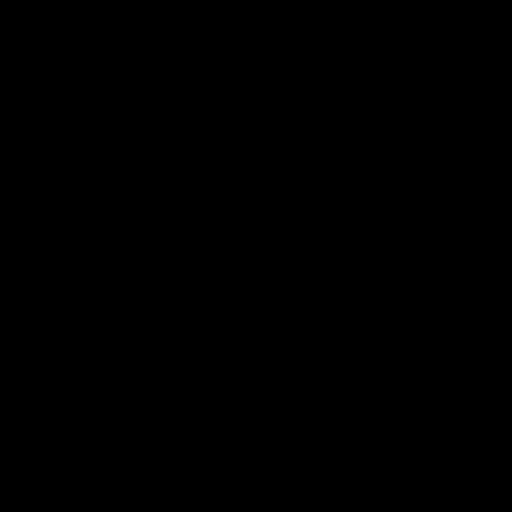

Epoch 0
PSNR: 4.935
Loss: 73966.570



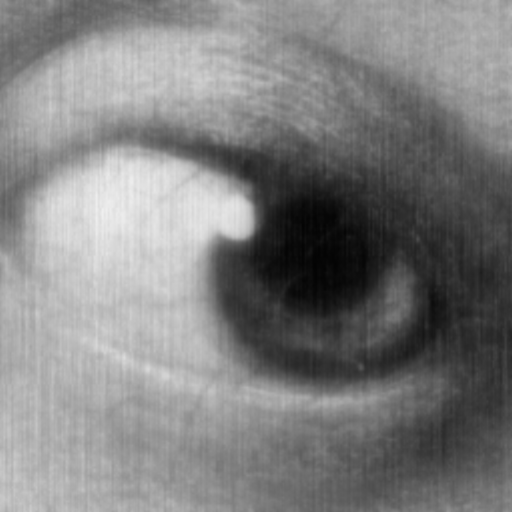

Epoch 50
PSNR: 25.998
Loss: 6544.979



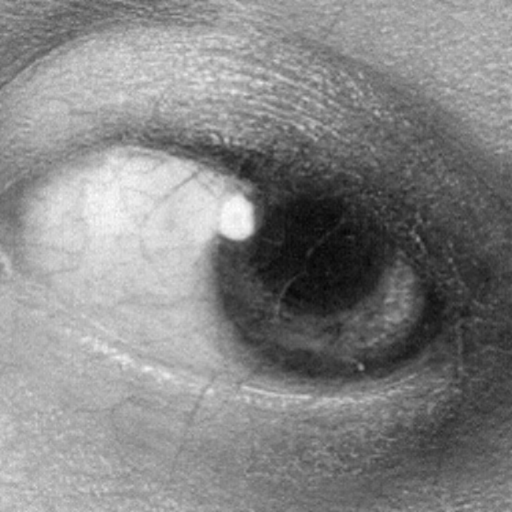

Epoch 100
PSNR: 32.630
Loss: 3050.192



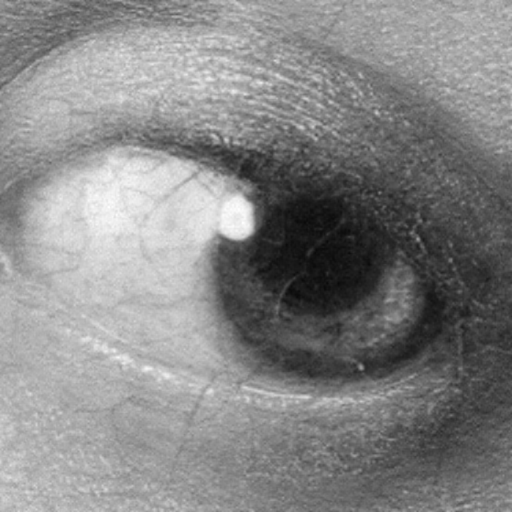

Epoch 150
PSNR: 33.799
Loss: 2665.996



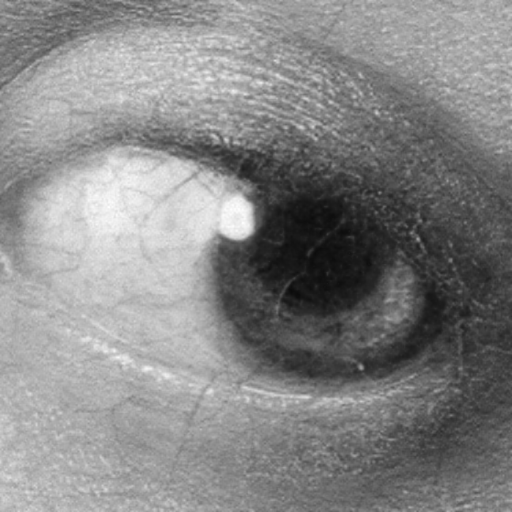

Epoch 200
PSNR: 34.347
Loss: 2502.998



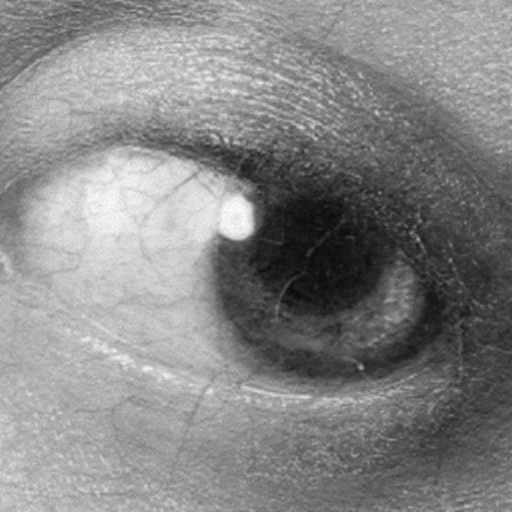

Epoch 250
PSNR: 35.084
Loss: 2299.491



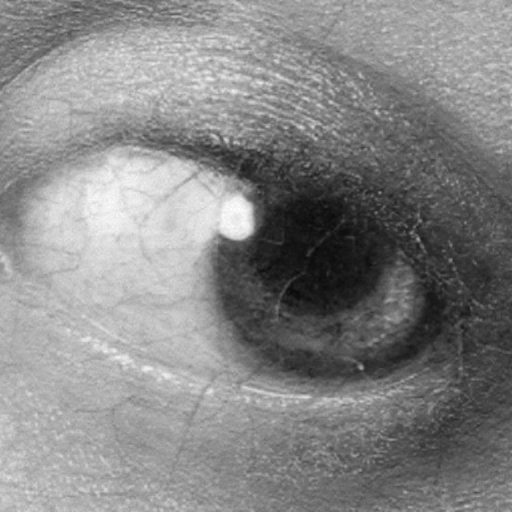

Epoch 300
PSNR: 36.042
Loss: 2059.275



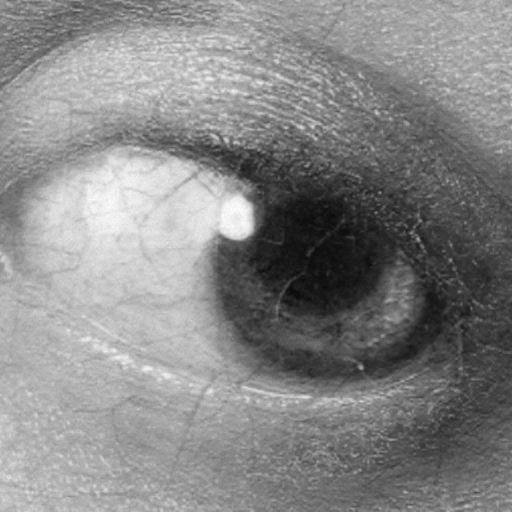

Epoch 350
PSNR: 37.129
Loss: 1817.059



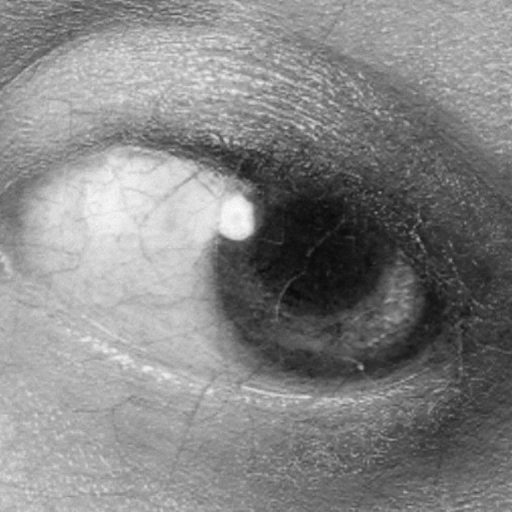

Epoch 400
PSNR: 38.104
Loss: 1624.061



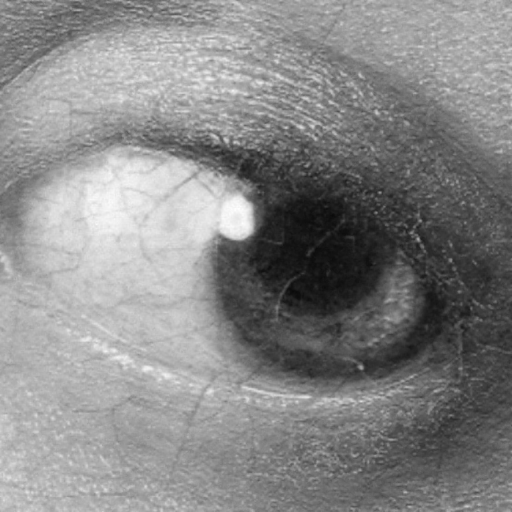

Epoch 450
PSNR: 38.761
Loss: 1505.797



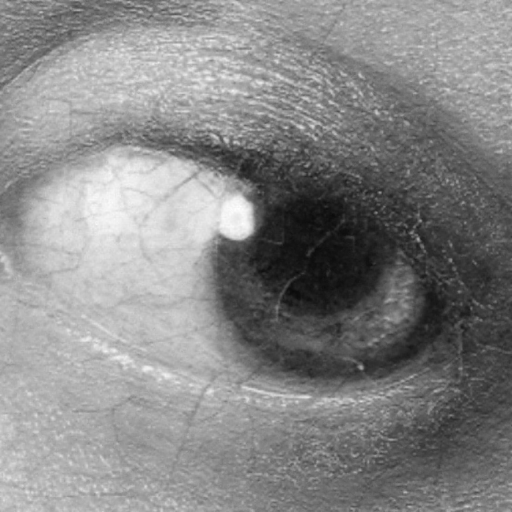

Epoch 500
PSNR: 39.270
Loss: 1420.101



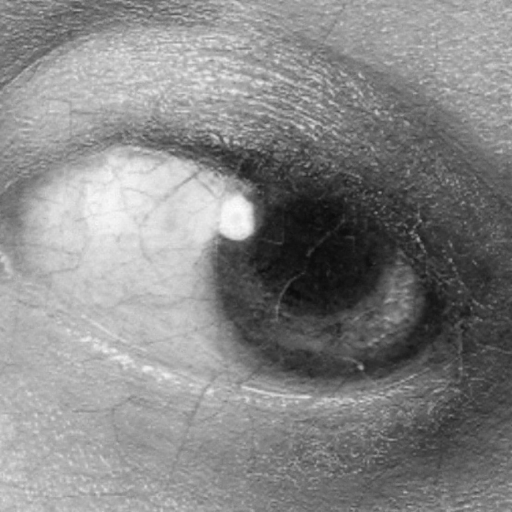

Epoch 550
PSNR: 40.030
Loss: 1301.073



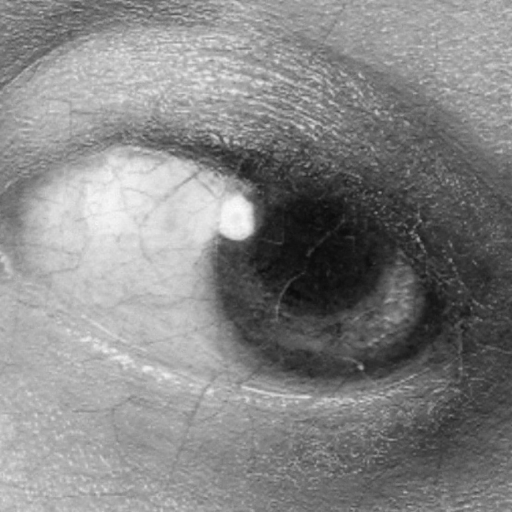

Epoch 600
PSNR: 40.533
Loss: 1227.920



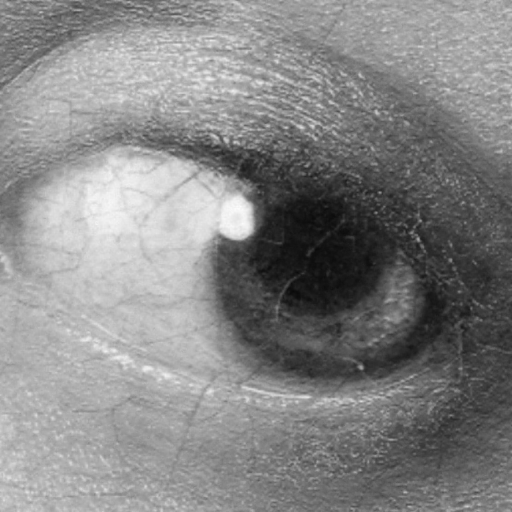

Epoch 650
PSNR: 40.667
Loss: 1209.157



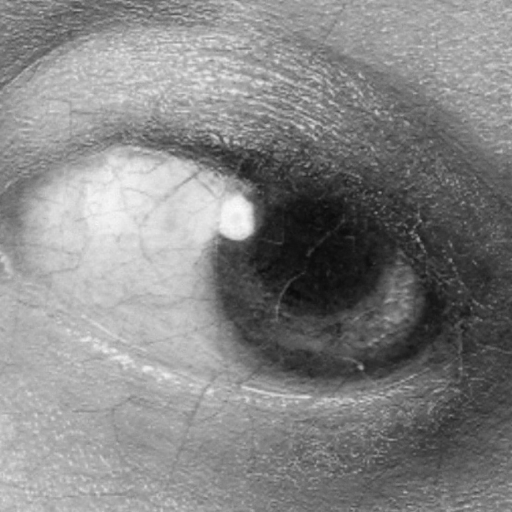

Epoch 700
PSNR: 40.676
Loss: 1207.896



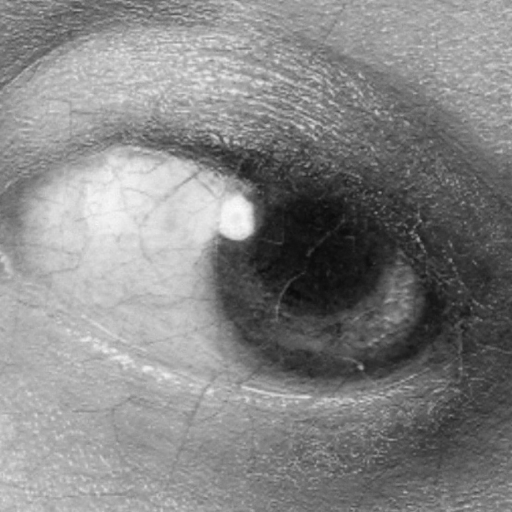

Epoch 750
PSNR: 40.966
Loss: 1168.126



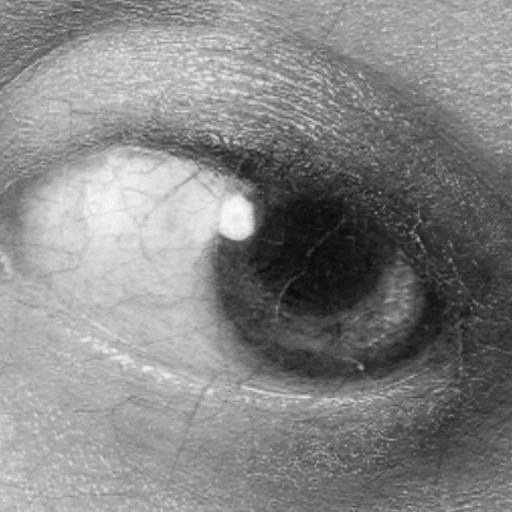

Epoch 800
PSNR: 41.204
Loss: 1136.650



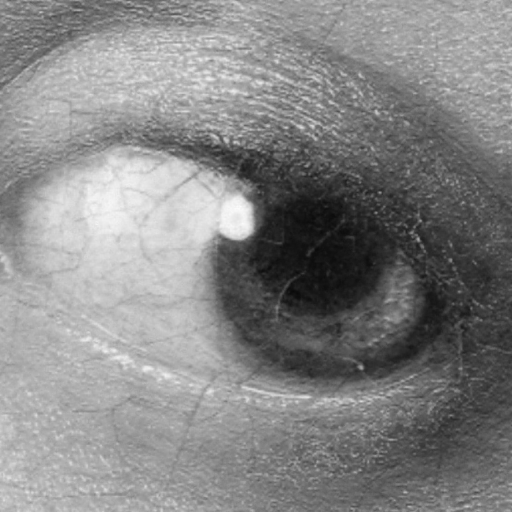

Epoch 850
PSNR: 41.324
Loss: 1120.994



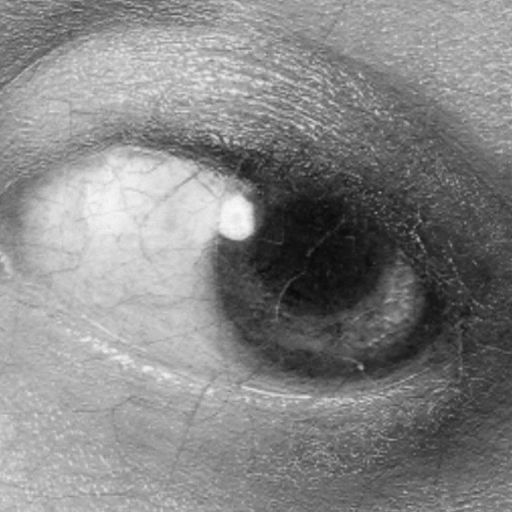

Epoch 900
PSNR: 41.430
Loss: 1107.407



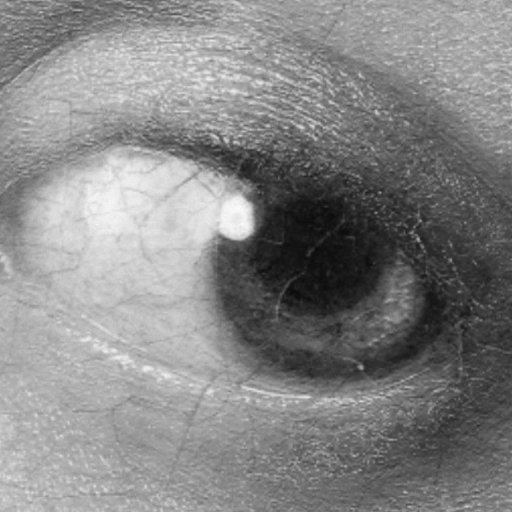

Epoch 950
PSNR: 41.553
Loss: 1091.896

>>> Finished
>>> Took 65.878 seconds
>>> Total number of params: 399068


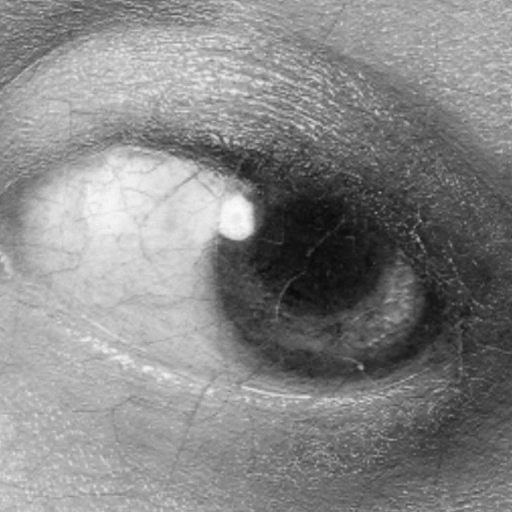

In [13]:
# train image, please first upload your image to current folder
image = Utils.read_grayscale("3.jpg",512,512)\
# Set N_max to be half the width
# L = 8,12,16
# T = 14-19
recovered = trainMultiHash([torch.from_numpy(image)],iter=1000,N_min=8,N_max=256,L=12,T=14,F=2)
Utils.show_grayscale(recovered[0].cpu().detach().numpy(),0)

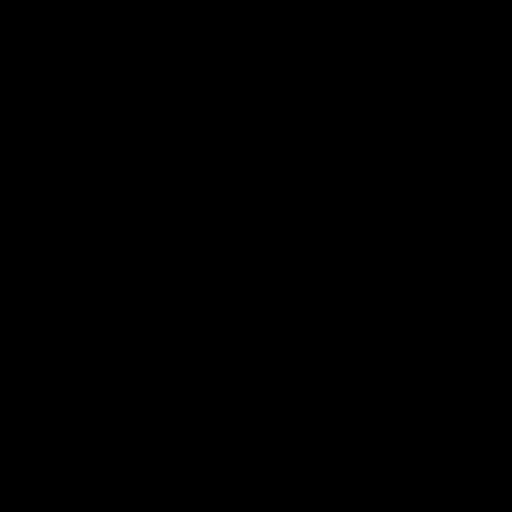

Epoch 0
PSNR: 5.139
Loss: 72836.062



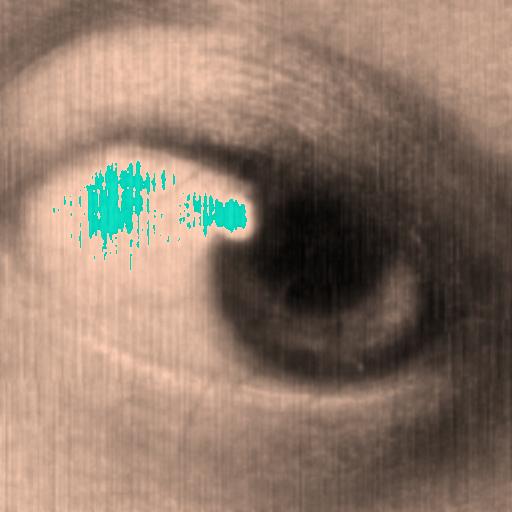

Epoch 50
PSNR: 24.373
Loss: 7893.490



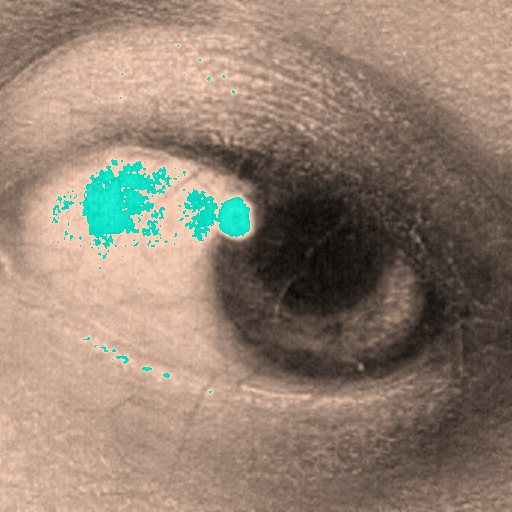

Epoch 100
PSNR: 27.848
Loss: 5380.344



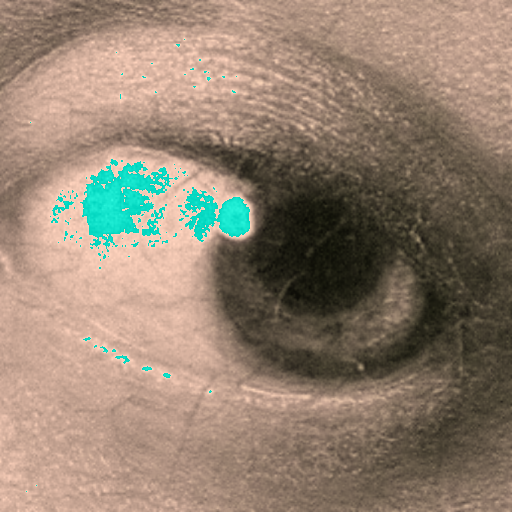

Epoch 150
PSNR: 28.434
Loss: 5085.055



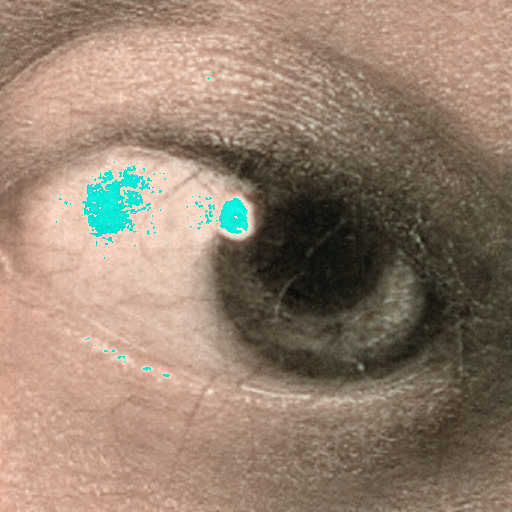

Epoch 200
PSNR: 30.053
Loss: 4183.946



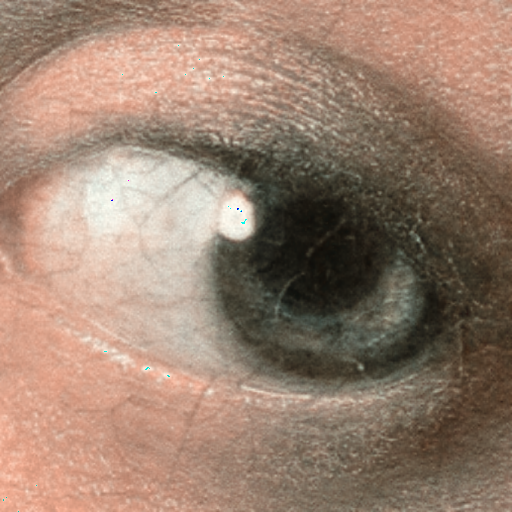

Epoch 250
PSNR: 32.898
Loss: 2960.576



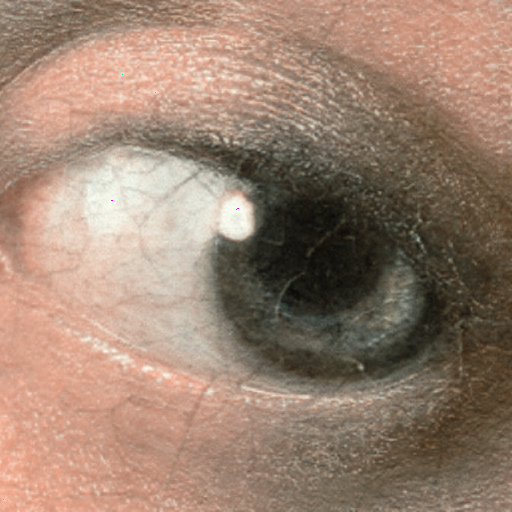

Epoch 300
PSNR: 34.317
Loss: 2516.246



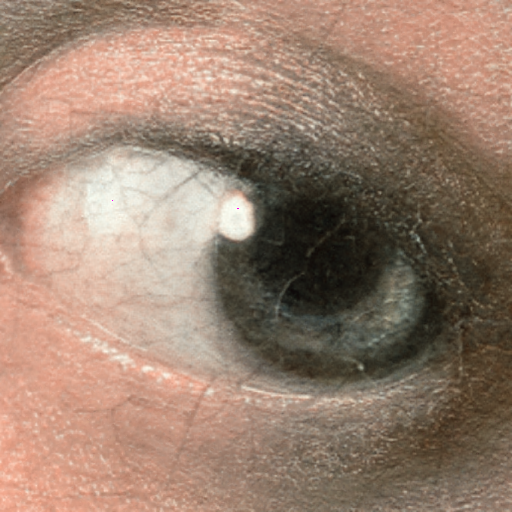

Epoch 350
PSNR: 35.328
Loss: 2239.575



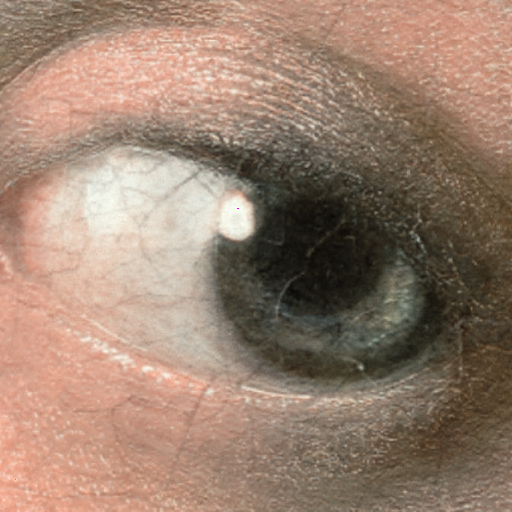

Epoch 400
PSNR: 35.942
Loss: 2086.300



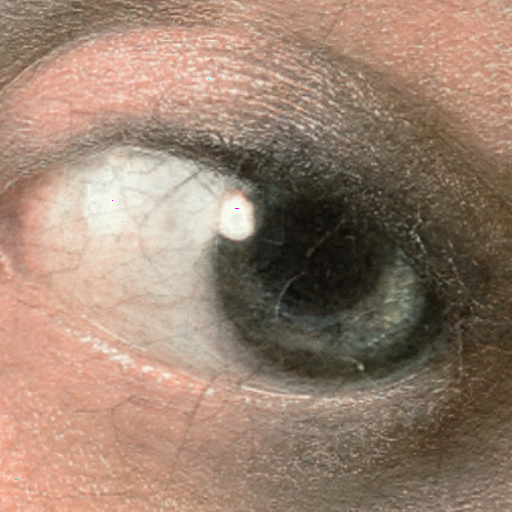

Epoch 450
PSNR: 36.225
Loss: 2018.690



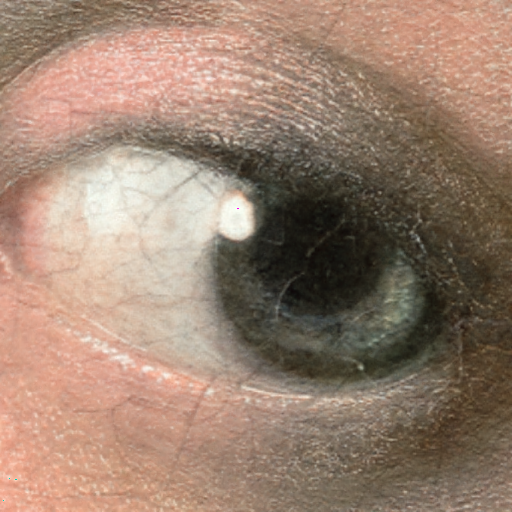

Epoch 500
PSNR: 36.715
Loss: 1907.249



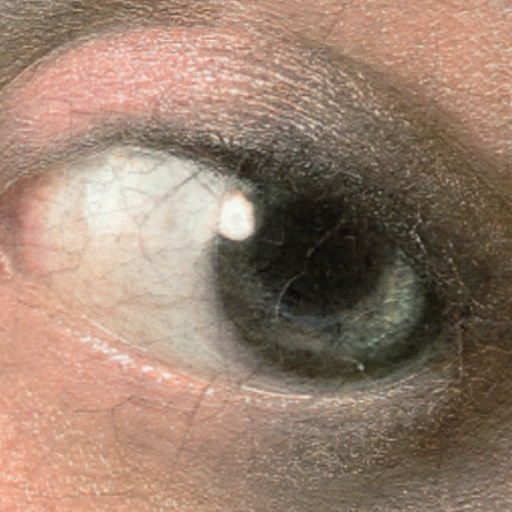

Epoch 550
PSNR: 36.914
Loss: 1863.944



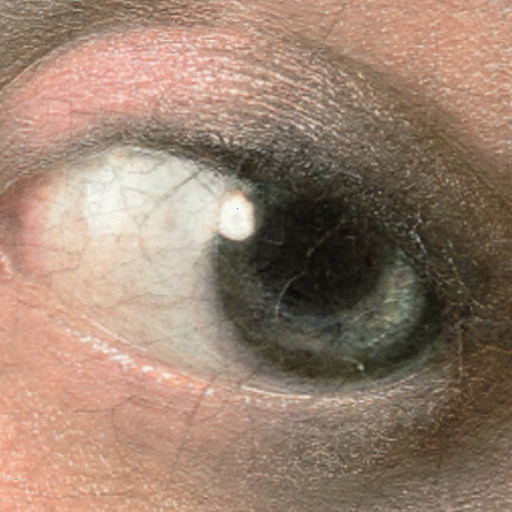

Epoch 600
PSNR: 37.172
Loss: 1809.191



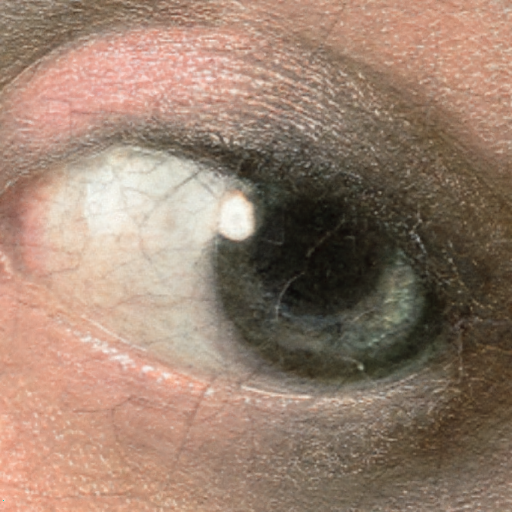

Epoch 650
PSNR: 37.410
Loss: 1760.427



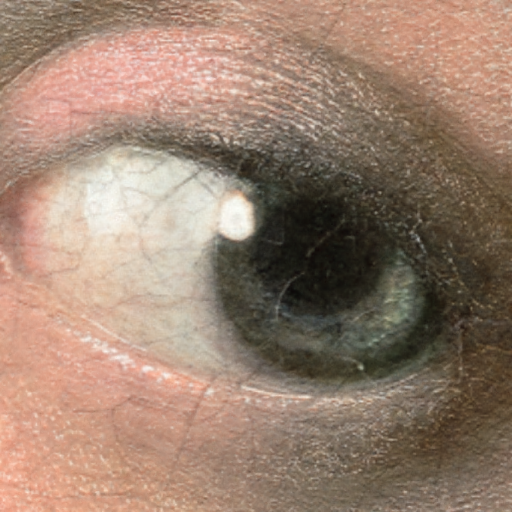

Epoch 700
PSNR: 37.549
Loss: 1732.465



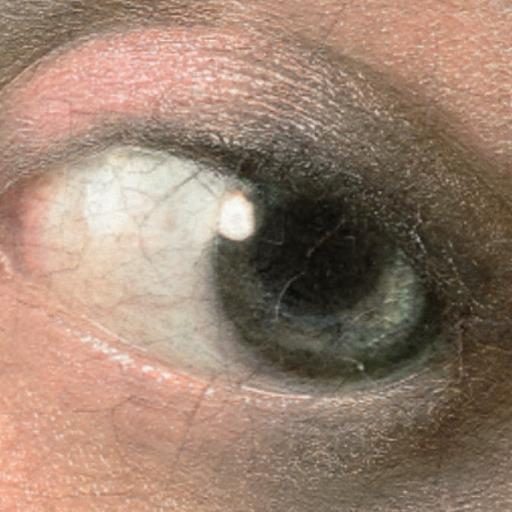

Epoch 750
PSNR: 37.650
Loss: 1712.414



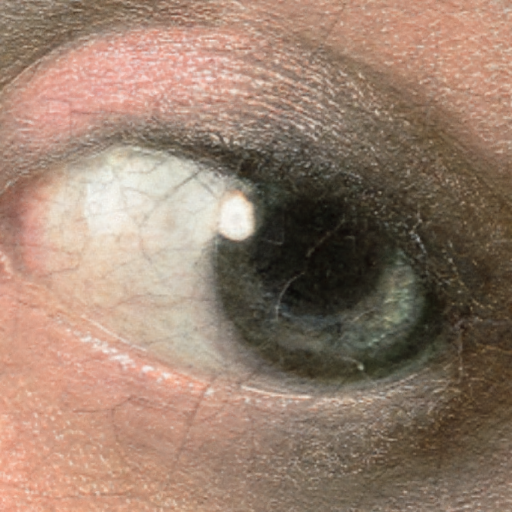

Epoch 800
PSNR: 37.149
Loss: 1813.938



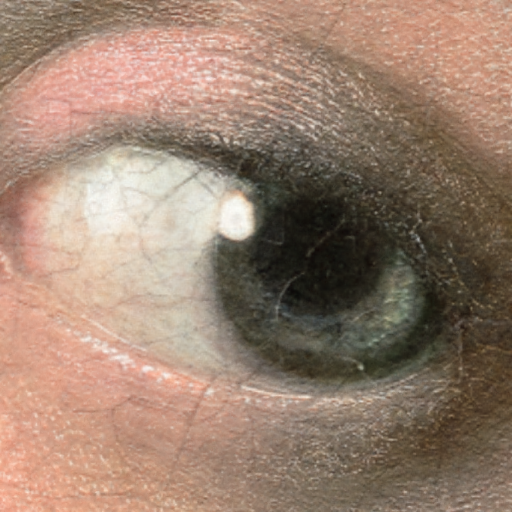

Epoch 850
PSNR: 37.824
Loss: 1678.477



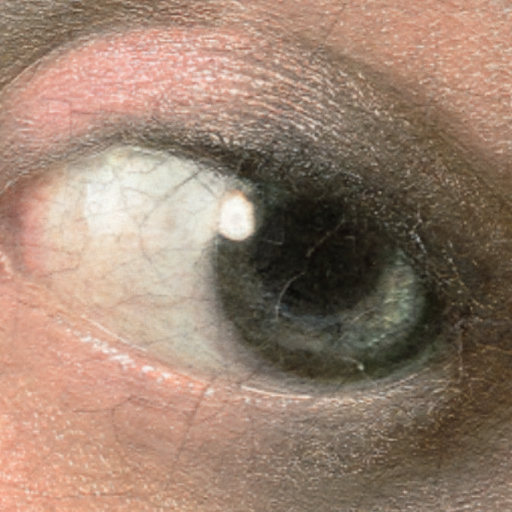

Epoch 900
PSNR: 37.798
Loss: 1683.443



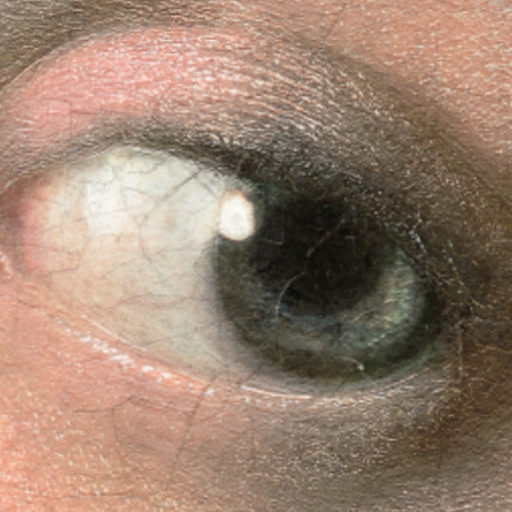

Epoch 950
PSNR: 37.934
Loss: 1657.410

>>> Finished
>>> Took 48.769 seconds
>>> Total number of params: 267610


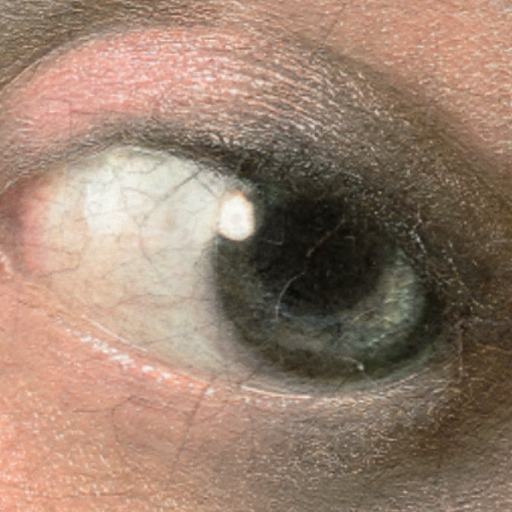

In [12]:
# RGB image
r,g,b = Utils.read("3.jpg",512,512)
recovered = trainMultiHash([torch.from_numpy(b),torch.from_numpy(g),torch.from_numpy(r)],iter=1000,N_min=16,N_max=256,L=8,T=14,F=2)
Utils.show([recovered[0].cpu().detach().numpy(),recovered[1].cpu().detach().numpy(),recovered[2].cpu().detach().numpy()],0)